# Loyal Insurer_ Step 1_ Pre-processing_Visualization_EDA:


### Mohammad Reza Rezaei Ghahreman - Code17 - File 1

In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
# from pandas_profiling import ydata_profiling # نشخه قديمي
# pip install ydata-profiling
import ydata_profiling as ydp
from sklearn.impute import KNNImputer
from sklearn.neighbors import LocalOutlierFactor
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.utils import class_weight
from sklearn.model_selection import cross_val_score
from sklearn import ensemble
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay, f1_score
# from keras.models import Sequential
# from keras.layers import Dense, Dropout
# from tensorflow.keras.optimizers import Adam
# from tensorflow.keras.utils import to_categorical
# from tensorflow.keras.callbacks import EarlyStopping
# %matplotlib notebook
# from IPython.display import display
import xgboost
import lightgbm

# معرفي كيس بيمه گذار وفادار سايت ديتا كوييز

<div dir = "rtl">                              
یکی از مهمترین و پر بازده ترین صنایع در کشورهای در حال توسعه، صنعت بیمه است و یکی از مهمترین مسائل برای هر کسب و کار تنظیم نیروی انسانی مشغول به کار، با میزان تقاضای بازار است.  به همین دلیل یکی از بزرگترین شرکت های بیمه کشور از ما کمک خواسته است تا  پیش بینی کنیم آیا هر بیمه گزار در سال آینده بیمه خود را تمدید می کند یا خیر. به این ترتیب این شرکت می تواند تخمین مناسبی از نیروی کار مورد نیاز برای سال آینده داشته باشد.
در این مجموعه داده برای هر نمونه 11 ویژگی شامل ویژگی های مختلف بیمه گزار از جمله درصد پرداخت نقدی حق بیمه، سن بیمه گزار به روز، میزان درآمد بیمه گزار و ... وجود دارد که براساس آنها باید ویژگی دوازدهم یعنی تمدید یا عدم تمدید بیمه برای سال آینده را مشخص کرد، این متغیر گسسته دو مقداری است داده ها شامل مقادیر از دست رفته نیز می باشد.
 داده های موجود به شدت نامتوازن بوده و درصد افرادی که بیمه خود را تمدید نمی کنند بسیار کمتر از افرادی است که بیمه خود را تمدید می کنند.
فایل خروجی باید دارای یک ستون باشد که مشخص کننده مقدار متغیر هدف به ازای هر نمونه باشد. تعداد سطرهای فایل خروجی برابر با تعداد نمونه های مجموعه داده آزمایش است.
ارزیابی خروجی ها با استفاده از معیار شاخص صورت می گیرد.
* با توجه به اینکه کلاس 0 کلاس اقلیت و مهمتر می باشد، در محاسبه شاخص اف این کلاس به عنوان کلاس مثبت در نظر گرفته شده است
</div>


<div dir = "rtl">
توصیف فیچرهای این کیس  به شرح ذیل می باشد:
    
    1-`perc_premium_paid_by_cash_credit`: درصد پرداخت حق بیمه به صورت نقدی توسط بیمه گزار به ازای مجموعه‌ی کل حق بیمه که باید پرداخت شود. مقدار بالاتر این فیچر نشان دهنده‌ی این است که بیمه گزار بیشتر از حق بیمه خود را به صورت نقدی پرداخت کرده است./
    
    2-`age_in_days`: سن بیمه گزار به صورت تعداد روزهاست. مقدار بیشتر این فیچر نشان دهنده‌ی این است که بیمه گزار سن بیشتری دارد./
    3-`Income`: درآمد سالیانه بیمه گزار است. مقدار بالاتر این فیچر به معنی درآمد بیشتر بیمه گزار است./
    4-`Count_3.6_months_late`: تعداد ماه‌هایی که بیمه گزار در آن‌ها بیشتر از 3 و کمتر از 6 ماه به پرداخت حق بیمه تأخیر داشته است./
    5-`Count_6.12_months_late`: تعداد ماه‌هایی که بیمه گزار در آن‌ها بیشتر از 6 و کمتر از 12 ماه به پرداخت حق بیمه تأخیر داشته است./
    6-`Count_more_than_12_months_late`: تعداد ماه‌هایی که بیمه گزار در آن‌ها بیشتر از 12 ماه به پرداخت حق بیمه تأخیر داشته است./
    7-`application_underwriting_score`: نمره‌ی تحت نظر گرفته شده برای بیمه گزار توسط شرکت بیمه در خصوص میزان ریسک بیمه گزار است./
    8-`no_of_premiums_paid`: تعداد حق بیمه‌هایی که بیمه گزار تا کنون پرداخت کرده است./
    9-`sourcing_channel`: کانالی که بیمه گزار از آن به شرکت بیمه مراجعه کرده است./
    10-`residence_area_type`: نوع منطقه زندگی بیمه گزار (شهری یا روستایی)./
    11-`premium`: حق بیمه مورد نیاز بیمه گزار./
    12-`renewal`: مقدار 1 یا 0 که نشان می‌دهد بیمه گزار در سال بعد حاضر برای تمدید بیمه خود هست یا خیر.
</div>


In [3]:
# df = pd.read_csv(r"""D:\1_Mohammad\1_Data Science\1_Data Science Tehran University\7_Python\SourceCode-ClassExersize\Final Project\Loyal Insurer\Data\1-Visualization-EDA\LoyalInsurerTrain.csv""")
# df_test = pd.read_csv(r"""D:\1_Mohammad\1_Data Science\1_Data Science Tehran University\7_Python\SourceCode-ClassExersize\Final Project\Loyal Insurer\Data\1-Visualization-EDA\LoyalInsurerTest.csv""")
df = pd.read_csv(r"""D:\1-Data Science\7-Python\SourceCode-ClassExersize\Final Project\Loyal Insurer\Data\0-Visualization-EDA\LoyalInsurerTrain.csv""")
df_test = pd.read_csv(r"""D:\1-Data Science\7-Python\SourceCode-ClassExersize\Final Project\Loyal Insurer\Data\0-Visualization-EDA\LoyalInsurerTest.csv""")

In [4]:
df.head()

,perc_premium_paid_by_cash_credit,age_in_days,Income,Count_3.6_months_late,Count_6.12_months_late,Count_more_than_12_months_late,application_underwriting_score,no_of_premiums_paid,sourcing_channel,residence_area_type,premium,renewal
0,0.429,12058,355060,0.0,0.0,0.0,99.02,13,C,Urban,3300,1
1,0.917,17531,84140,2.0,3.0,1.0,98.69,7,C,Rural,3300,0
2,0.049,15341,250510,0.0,0.0,0.0,99.57,9,A,Urban,9600,1
3,0.052,31400,198680,0.0,0.0,0.0,99.87,12,B,Urban,9600,1
4,1.000,24829,118400,0.0,0.0,0.0,99.05,11,B,Urban,7500,1


In [5]:
# Print the dimensions of the dataframe
print('Number of rows:', df.shape[0])
print('Number of columns:', df.shape[1])
print('Number of rows:', df_test.shape[0])
print('Number of columns:', df_test.shape[1])
print("Data shape:", df.shape)
print("Test data shape:", df_test.shape)

Number of rows: 53236
Number of columns: 12
Number of rows: 26617
Number of columns: 11
Data shape: (53236, 12)
Test data shape: (26617, 11)


In [6]:
df.columns

Index(['perc_premium_paid_by_cash_credit', 'age_in_days', 'Income',
       'Count_3.6_months_late', 'Count_6.12_months_late',
       'Count_more_than_12_months_late', 'application_underwriting_score',
       'no_of_premiums_paid', 'sourcing_channel', 'residence_area_type',
       'premium', 'renewal'],
      dtype='object')

In [7]:
df_test.columns

Index(['perc_premium_paid_by_cash_credit', 'age_in_days', 'Income',
       'Count_3.6_months_late', 'Count_6.12_months_late',
       'Count_more_than_12_months_late', 'application_underwriting_score',
       'no_of_premiums_paid', 'sourcing_channel', 'residence_area_type',
       'premium'],
      dtype='object')

In [8]:
df.head()

,perc_premium_paid_by_cash_credit,age_in_days,Income,Count_3.6_months_late,Count_6.12_months_late,Count_more_than_12_months_late,application_underwriting_score,no_of_premiums_paid,sourcing_channel,residence_area_type,premium,renewal
0,0.429,12058,355060,0.0,0.0,0.0,99.02,13,C,Urban,3300,1
1,0.917,17531,84140,2.0,3.0,1.0,98.69,7,C,Rural,3300,0
2,0.049,15341,250510,0.0,0.0,0.0,99.57,9,A,Urban,9600,1
3,0.052,31400,198680,0.0,0.0,0.0,99.87,12,B,Urban,9600,1
4,1.000,24829,118400,0.0,0.0,0.0,99.05,11,B,Urban,7500,1


In [9]:
df.tail()

,perc_premium_paid_by_cash_credit,age_in_days,Income,Count_3.6_months_late,Count_6.12_months_late,Count_more_than_12_months_late,application_underwriting_score,no_of_premiums_paid,sourcing_channel,residence_area_type,premium,renewal
53231,0.994,20445,186830,0.0,0.0,0.0,99.67,5,A,Urban,18000,1
53232,0.118,22275,195070,0.0,0.0,0.0,99.25,11,A,Urban,9600,1
53233,0.033,18265,301540,0.0,0.0,0.0,99.89,4,A,Rural,13800,1
53234,0.000,23372,305020,0.0,0.0,0.0,98.89,12,A,Rural,9600,1
53235,0.550,15709,280140,1.0,0.0,1.0,99.84,8,A,Urban,9600,0


# Exploratory Data Analysis (EDA)

# تبدیل ستون سن از روز به سال و اعمال روی دیتافریم :

## Notice: در هر بار باز کردن این نوت بوک این دستور اجرا شود

In [10]:
# # براي اينكه براي بار دوم اجرا شد خطا ندهد كامنت كردم
# df['age_in_years'] = df['age_in_days'] // 365 # ایجاد ستون جدید با نام 'age_in_years'
# df.drop('age_in_days', axis=1, inplace=True) # حذف ستون قبلی با نام 'age_in_days'
# # جابجایی ستون age_in_years به عنوان ستون دوم
# df.insert(1, 'age_in_years', df.pop('age_in_years'))

In [11]:
df.columns   # age in year

Index(['perc_premium_paid_by_cash_credit', 'age_in_years', 'Income',
       'Count_3.6_months_late', 'Count_6.12_months_late',
       'Count_more_than_12_months_late', 'application_underwriting_score',
       'no_of_premiums_paid', 'sourcing_channel', 'residence_area_type',
       'premium', 'renewal'],
      dtype='object')

In [12]:
# # براي اينكه براي بار دوم اجرا شد خطا ندهد كامنت كردم
# df_test['age_in_years'] = df_test['age_in_days'] // 365 # ایجاد ستون جدید با نام 'age_in_years'
# df_test.drop('age_in_days', axis=1, inplace=True) # حذف ستون قبلی با نام 'age_in_days'
# # جابجایی ستون age_in_years به عنوان ستون دوم
# df_test.insert(1, 'age_in_years', df_test.pop('age_in_years'))

In [13]:
df_test.columns

Index(['perc_premium_paid_by_cash_credit', 'age_in_years', 'Income',
       'Count_3.6_months_late', 'Count_6.12_months_late',
       'Count_more_than_12_months_late', 'application_underwriting_score',
       'no_of_premiums_paid', 'sourcing_channel', 'residence_area_type',
       'premium'],
      dtype='object')

In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 53236 entries, 0 to 53235
Data columns (total 12 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   perc_premium_paid_by_cash_credit  53236 non-null  float64
 1   age_in_years                      53236 non-null  int64  
 2   Income                            53236 non-null  int64  
 3   Count_3.6_months_late             53172 non-null  float64
 4   Count_6.12_months_late            53172 non-null  float64
 5   Count_more_than_12_months_late    53172 non-null  float64
 6   application_underwriting_score    51260 non-null  float64
 7   no_of_premiums_paid               53236 non-null  int64  
 8   sourcing_channel                  53236 non-null  object 
 9   residence_area_type               53236 non-null  object 
 10  premium                           53236 non-null  int64  
 11  renewal                           53236 non-null  int64  
dtypes: f

In [15]:
df.head()

,perc_premium_paid_by_cash_credit,age_in_years,Income,Count_3.6_months_late,Count_6.12_months_late,Count_more_than_12_months_late,application_underwriting_score,no_of_premiums_paid,sourcing_channel,residence_area_type,premium,renewal
0,0.429,33,355060,0.0,0.0,0.0,99.02,13,C,Urban,3300,1
1,0.917,48,84140,2.0,3.0,1.0,98.69,7,C,Rural,3300,0
2,0.049,42,250510,0.0,0.0,0.0,99.57,9,A,Urban,9600,1
3,0.052,86,198680,0.0,0.0,0.0,99.87,12,B,Urban,9600,1
4,1.000,68,118400,0.0,0.0,0.0,99.05,11,B,Urban,7500,1


In [16]:
# display missing values in data
print(df.isnull().sum())

perc_premium_paid_by_cash_credit       0
age_in_years                           0
Income                                 0
Count_3.6_months_late                 64
Count_6.12_months_late                64
Count_more_than_12_months_late        64
application_underwriting_score      1976
no_of_premiums_paid                    0
sourcing_channel                       0
residence_area_type                    0
premium                                0
renewal                                0
dtype: int64


## ProfileReport

In [17]:
profile = ydp.ProfileReport(df)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# results:
1- Dataset has 1 (< 0.1%) duplicate rows	Duplicates\
##############################################################\
age has normal distribution\
no_of_premiums_paid has normal distribution\
Income is highly skewed (γ1 = 102.7601689)	Skewed\

##############################################################\
premium needs to check outlier data\ 
##############################################################\
Categrical Features: "sourcing_channel" , "residence_area_type" \
##############################################################\
Income is high overall correlated with premium	High correlation: o.6\
no_of_premiums_paid is mediom overall correlated with application_underwriting_score Mediom correlation\
##############################################################\
Target Variable (renewal) is highly imbalanced (66.4%)	Imbalance\
##############################################################\
application_underwriting_score has 1976 (3.7%) missing values	Missing\
##############################################################\
perc_premium_paid_by_cash_credit has 3817 (7.2%) zeros	Zeros\
Count_3.6_months_late has 44533 (83.7%) zeros	Real Zeros\
Count_6.12_months_late has 50572 (95.0%) zeros	Real Zeros\
Count_more_than_12_months_late has 50672 (95.2%) Real zeros	Zeros\

In [20]:
from dataprep.eda import create_report
create_report(df).show_browser()

  0%|                                                                                         | 0/2053 [00:00<…

C:\Users\Administrator\AppData\Local\Programs\Python\Python310\lib\site-packages\dask\core.py:121: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))
C:\Users\Administrator\AppData\Local\Programs\Python\Python310\lib\site-packages\dask\core.py:121: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))


### Defining Categorical Features 

In [21]:
# دریافت نام ستو نهای کتگوریکال
cat_columns = df.select_dtypes(['object']).columns
print(cat_columns)

Index(['sourcing_channel', 'residence_area_type'], dtype='object')


## Summary Information About Categorical Features 

In [24]:
# براي اينكه بتوانيم نمودارهاي مخصوص داده هاي كتگوري را نصب كنيم ستون هاي كتگوري را به كتگوري تبديل كرديم
categorical_columns = ['sourcing_channel', 'residence_area_type']
df.loc[:, categorical_columns] = df.loc[:, categorical_columns].astype('category')

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 53236 entries, 0 to 53235
Data columns (total 12 columns):
 #   Column                            Non-Null Count  Dtype   
---  ------                            --------------  -----   
 0   perc_premium_paid_by_cash_credit  53236 non-null  float64 
 1   age_in_years                      53236 non-null  int64   
 2   Income                            53236 non-null  int64   
 3   Count_3.6_months_late             53172 non-null  float64 
 4   Count_6.12_months_late            53172 non-null  float64 
 5   Count_more_than_12_months_late    53172 non-null  float64 
 6   application_underwriting_score    51260 non-null  float64 
 7   no_of_premiums_paid               53236 non-null  int64   
 8   sourcing_channel                  53236 non-null  category
 9   residence_area_type               53236 non-null  category
 10  premium                           53236 non-null  int64   
 11  renewal                           53236 non-null  int6

C:\Users\Administrator\AppData\Local\Temp\ipykernel_11724\2402486482.py:3: DeprecationWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  df.loc[:, categorical_columns] = df.loc[:, categorical_columns].astype('category')


In [25]:
df["sourcing_channel"].dtype

CategoricalDtype(categories=['A', 'B', 'C', 'D', 'E'], ordered=False)

In [26]:
df["residence_area_type"].dtype

CategoricalDtype(categories=['Rural', 'Urban'], ordered=False)

### Categorical Features Ratio 

In [27]:
# محاسبه فراوانی هر دسته
freq1 = df['sourcing_channel'].value_counts()

# نمایش فراوانی هر دسته
print(freq1)

A    28884
B    10990
C     7970
D     4993
E      399
Name: sourcing_channel, dtype: int64


In [28]:
# محاسبه فراوانی هر دسته
freq2 = df["residence_area_type"].value_counts()

# نمایش فراوانی هر دسته
print(freq2)

Urban    32111
Rural    21125
Name: residence_area_type, dtype: int64


## show_categorical_features:

In [29]:
def show_categorical_features_ratio(data):
    %matplotlib notebook

    categorical_columns = [column for column in data.columns if data[column].dtypes == "category"]
    categ = data.loc[:, categorical_columns]
    
    fig, axes = plt.subplots(1, 2, figsize = (10, 5))
    for i, col in enumerate(categ):
        column_values = data[col].value_counts()
        labels = column_values.index
        sizes = column_values.values
        axes[i].pie(sizes, labels = labels, colors = sns.color_palette("Reds"), autopct = '%1.0f%%', startangle = 90)
        axes[i].axis('equal')
        axes[i].set_title(col, fontsize=15)
        
    plt.show()


<IPython.core.display.Javascript object>


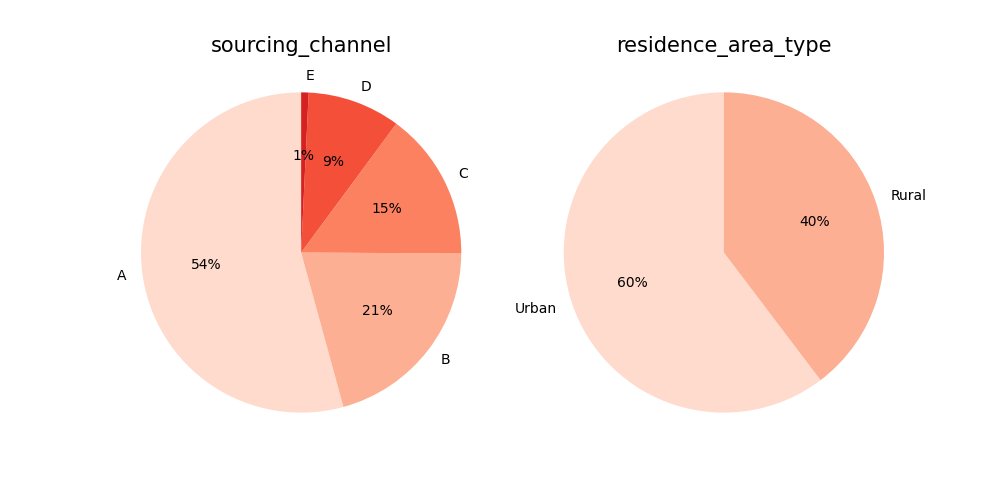

In [30]:
show_categorical_features_ratio(df)

## Summary Information About Quantitative Features 

In [31]:
df.describe()

,perc_premium_paid_by_cash_credit,age_in_years,Income,Count_3.6_months_late,Count_6.12_months_late,Count_more_than_12_months_late,application_underwriting_score,no_of_premiums_paid,premium,renewal
count,53236.000000,53236.000000,5.323600e+04,53172.000000,53172.000000,53172.000000,51260.000000,53236.000000,53236.000000,53236.000000
mean,0.314407,51.616744,2.096828e+05,0.250019,0.077240,0.060652,99.062739,10.879198,10875.163423,0.937956
std,0.334858,14.293509,5.763242e+05,0.696721,0.436435,0.314925,0.746464,5.168850,9318.368252,0.241239
min,0.000000,21.000000,2.403000e+04,0.000000,0.000000,0.000000,91.960000,2.000000,1200.000000,0.000000
25%,0.034000,41.000000,1.076000e+05,0.000000,0.000000,0.000000,98.810000,7.000000,5400.000000,1.000000
50%,0.167000,51.000000,1.659600e+05,0.000000,0.000000,0.000000,99.210000,10.000000,7500.000000,1.000000
75%,0.539000,62.000000,2.509900e+05,0.000000,0.000000,0.000000,99.530000,14.000000,13800.000000,1.000000
max,1.000000,103.000000,9.026260e+07,13.000000,17.000000,11.000000,99.890000,60.000000,60000.000000,1.000000


### Target Variable Ratio

<div dir = "rtl">
چون ما از نسخه غیر گرافیکی مت پلات ليب استفاده می‌کنیم که امکان نمایش نمودار را ندارد. می‌توانیم از یکی از بك اندهاي گرافیکی مت پلات ليب به نام ، `inline` يا %matplotlib inline` استفاده كرد. 
</dir>

In [32]:
def categorical_variable_ratio(target, colors=None):
    """
    تابعی برای نمایش درصد توزیع یک متغیر دسته ای در قالب یک نمودار دایره ای.

    param target: سری داده ای مربوط به متغیر دسته ای که قرار است درصد توزیع آن نمایش داده شود.
    param colors: لیستی از رنگ ها برای نمایش بخش های مختلف نمودار دایره ای.
    """
    %matplotlib notebook

    if colors is None:
        colors = ['#FFB6C1', '#FF0000']

    plt.pie(target.value_counts(), labels=target.value_counts().index, colors=colors, autopct='%1.1f%%')
    plt.axis('equal')
    plt.show()


<IPython.core.display.Javascript object>


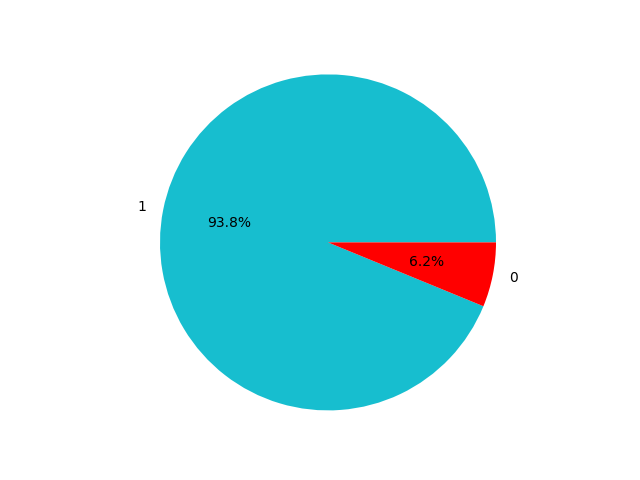

In [33]:
# categorical_variable_ratio(df["renewal"], colors=['#FFB6C1', '#FF0000'])
categorical_variable_ratio(df["renewal"],  colors=['#17becf','#FF0000'])

داده هدف به شدت نامتوازن است.

<IPython.core.display.Javascript object>


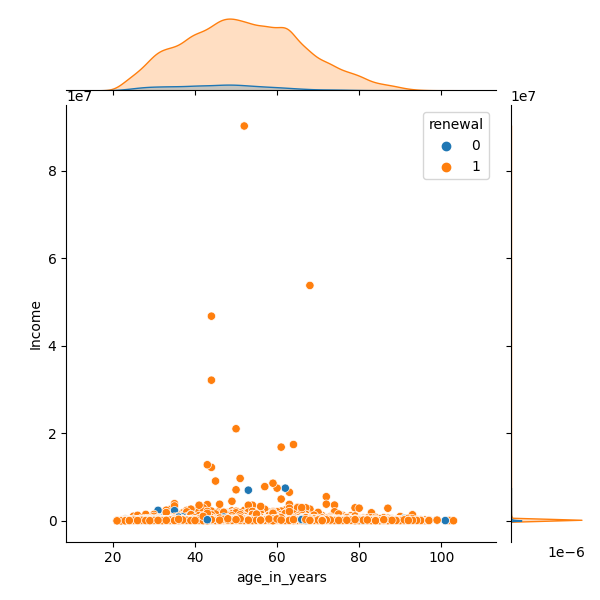

In [34]:
# A seaborn jointplot shows bivariate scatterplots and univariate histograms in the same figure
sns.jointplot(x="age_in_years", y="Income", data=df, hue="renewal")

<IPython.core.display.Javascript object>


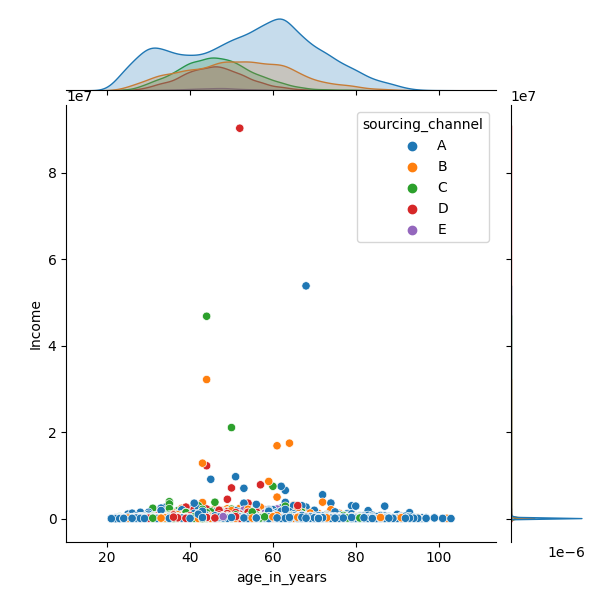

In [35]:
sns.jointplot(x="age_in_years", y="Income", data=df, hue="sourcing_channel")

<IPython.core.display.Javascript object>


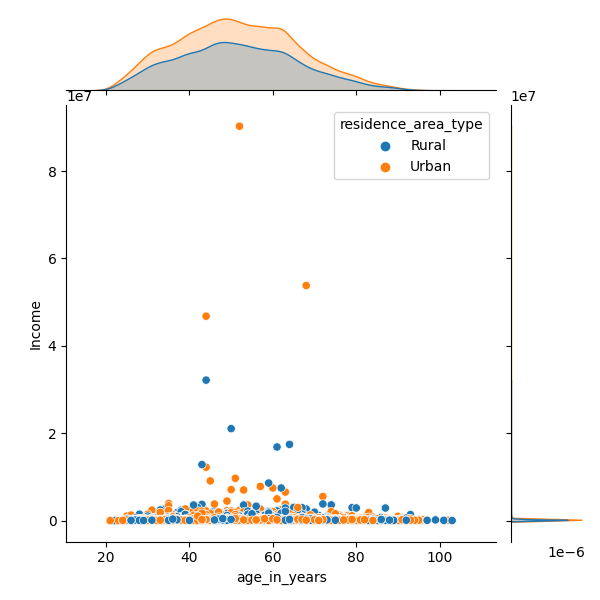

In [36]:
sns.jointplot(x="age_in_years", y="Income", data=df , hue="residence_area_type")

<IPython.core.display.Javascript object>


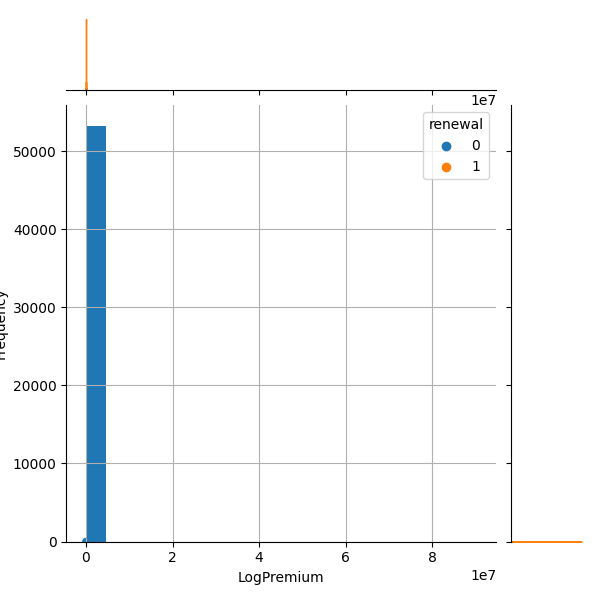

In [37]:
sns.jointplot(x="Count_3.6_months_late", y="Count_more_than_12_months_late", data= df, hue="renewal")

### Pairplot of Features

<IPython.core.display.Javascript object>


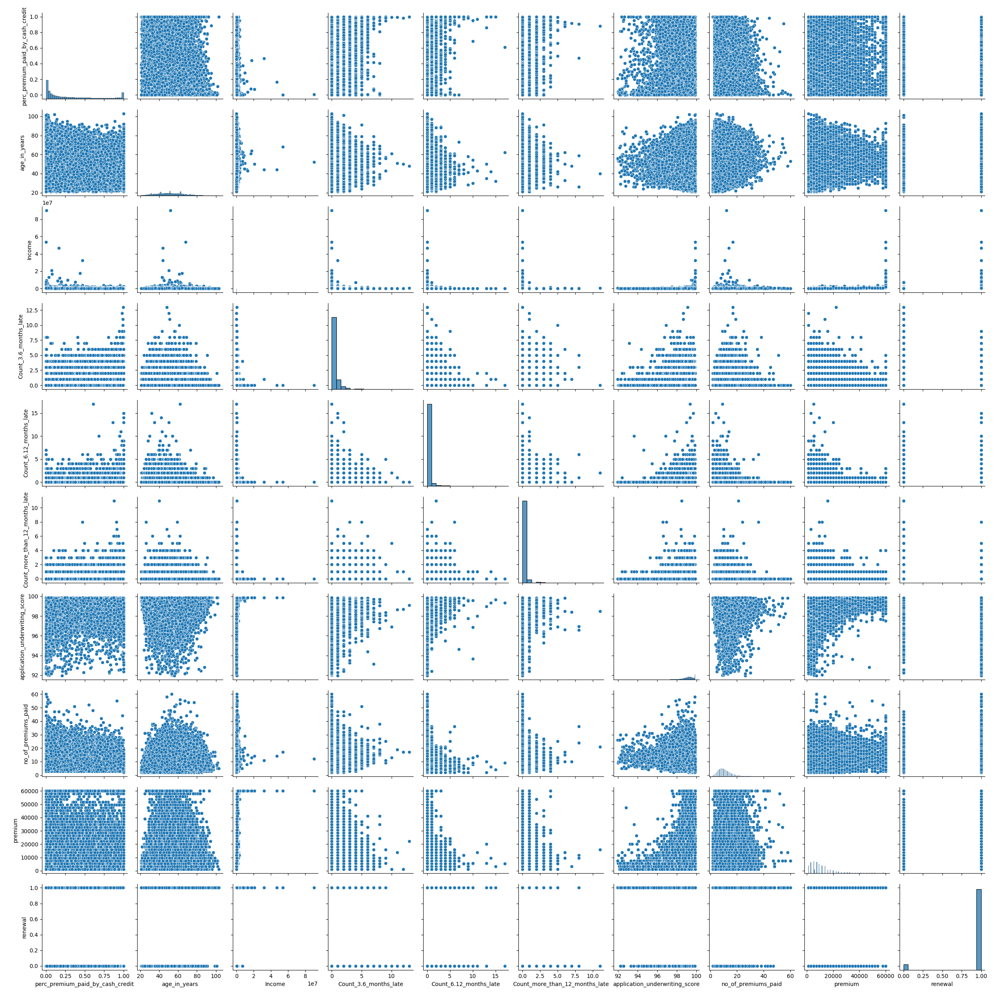

In [39]:
# %matplotlib notebook

sns.pairplot(df)
plt.show();

## Correlation Matrix For Numerical Features

In [40]:
def show_corr_matrix(data, hight, width):
    corr_mat = data.corr()
    plt.figure(figsize=(width, hight))
    sns.heatmap(corr_mat, square = True,  cmap=sns.color_palette('coolwarm', 10), annot=True, fmt='.2g')
    plt.show()

C:\Users\Administrator\AppData\Local\Temp\ipykernel_11724\1046303760.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_mat = data.corr()


<IPython.core.display.Javascript object>


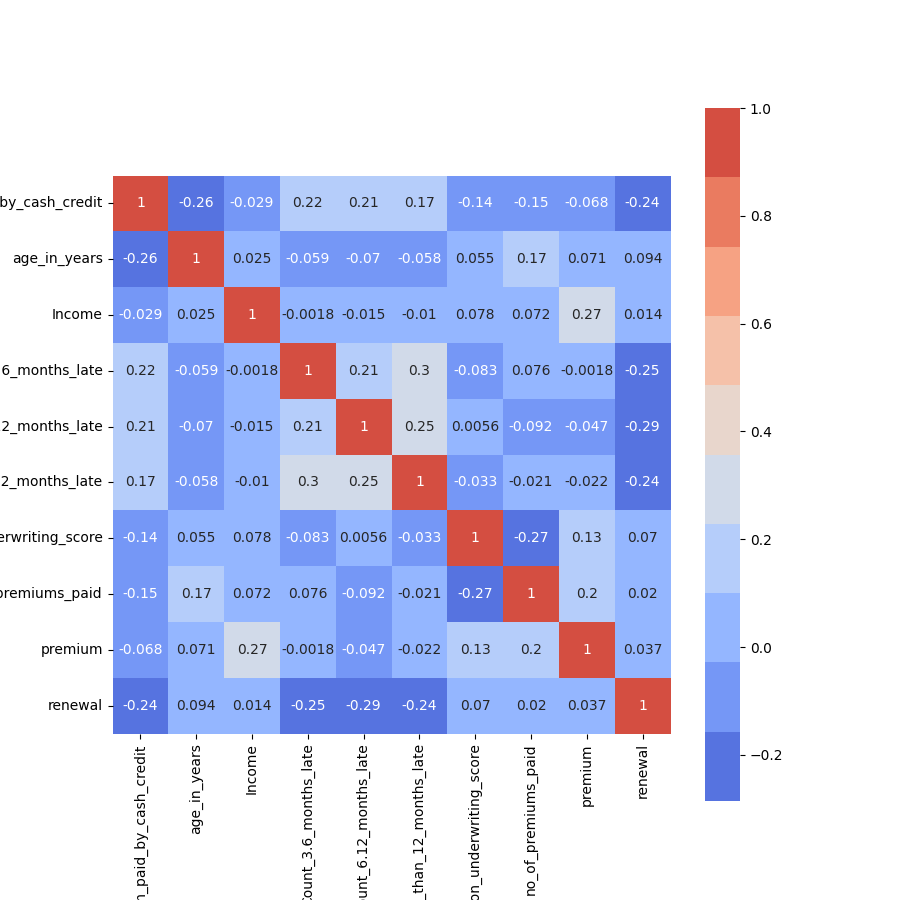

In [41]:
show_corr_matrix(df, 9, 9)

It seems we have no highly correlated features.

# بررسی تمایز بین داده ها - Distinct:

<div dir = "rtl">
این شاخص تمایز یک ویژگی در تحلیل داده‌ها است که می‌تواند اطلاعات مفیدی درباره فیچر فراهم نماید. با افزایش تعداد مقادیر متمایز یک ویژگی، دقت و دقت تخمین‌های مبتنی بر آن ویژگی افزایش می‌یابد./
    با این حال، اگر تعداد مقادیر متمایز بسیار زیاد باشد، ممکن است تحلیل داده برای آن ویژگی پیچیده شود و نیاز به روش‌های پیشرفته‌تر و محاسباتی بیشتری داشته باشد. 
به علاوه، در صورتی که مقادیر متمایز کم باشند، احتمال وجود داده‌های تکراری بیشتر است که این می‌تواند به عدم تنوع داده‌ها و کاهش دقت در تخمین پارامترهای مربوط به آن ویژگی منجر شود./
    برای ساخت این دیتافریم، از یک دیکشنری استفاده شده است. در این دیکشنری، کلید
`feature` متناظر با هر فیچر است و مقدار `()df[features].nunique` تعداد مقادیر متمایز هر فیچر را در دیتافریم اصلی محاسبه می‌کند. سپس با استفاده از تابع `()pd.DataFrame` این دیکشنری به دیتافریمی با دو ستون تبدیل شده و در `df_distinct` /ذخیره شده است
    این دستور برای افزودن اعداد بالای هر میله در نمودار میله‌ای استفاده می‌شود. برای هر میله در لیست `rects`، ارتفاع آن میله با استفاده از تابع `get_height` استخراج شده و در متغیر `height` ذخیره می‌شود. سپس با استفاده از تابع `annotate`، اعداد بالای هر میله به نمودار اضافه می‌شوند./
    در تابع `annotate`، متنی که برای نمایش اعداد بالای میله استفاده می‌شود با استفاده از `format` و مقدار `height` ساخته می‌شود. سپس مکانی که متن باید نمایش داده شود با استفاده از `xy` تعیین می‌شود. در اینجا، مکان این متن برابر با وسط میله و ارتفاع آن میله است. همچنین مکانی که متن باید قرار داده شود با استفاده از `xytext` تعیین شده است. در این حالت، متن ۳ پیکسل بالای محور y میله‌ها قرار دارد. مقدار `textcoords` نیز نوع مختصاتی را که برای `xy` و `xytext` استفاده شده است، تعیین می‌کند./
    در نهایت، موقعیت افقی و عمودی متن با استفاده از `ha` و `va` تعیین می‌شود. در این حالت، متن باید در وسط میله در محور x و در بالای میله در محور y قرار گیرد./
</div>

<IPython.core.display.Javascript object>


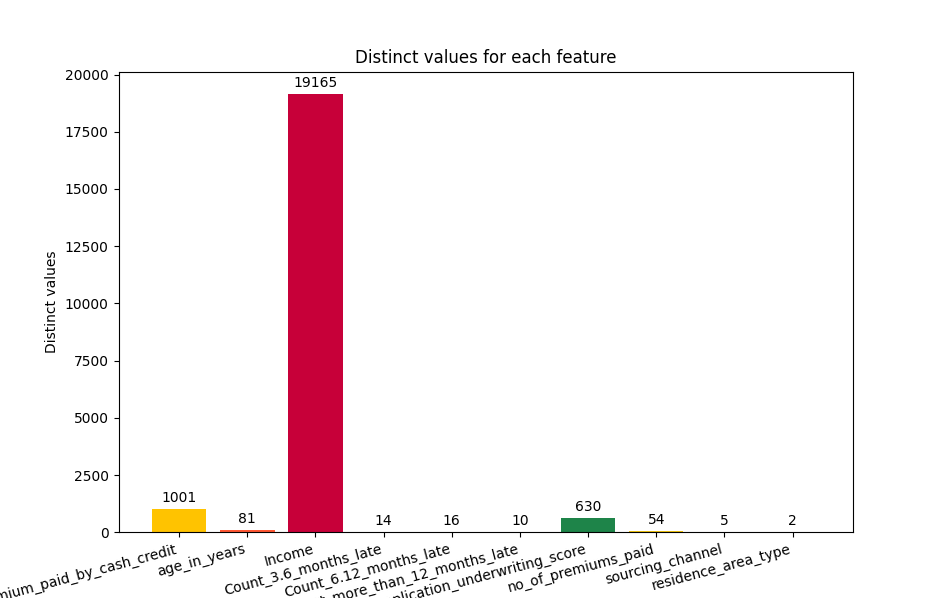

                                                           feature  distinct
perc_premium_paid_by_cash_credit  perc_premium_paid_by_cash_credit      1001
age_in_years                                          age_in_years        81
Income                                                      Income     19165
Count_3.6_months_late                        Count_3.6_months_late        14
Count_6.12_months_late                      Count_6.12_months_late        16
Count_more_than_12_months_late      Count_more_than_12_months_late        10
application_underwriting_score      application_underwriting_score       630
no_of_premiums_paid                            no_of_premiums_paid        54
sourcing_channel                                  sourcing_channel         5
residence_area_type                            residence_area_type         2


In [46]:
# import pandas as pd
# import matplotlib.pyplot as plt
# %matplotlib notebook


# مقادیر فیچرها در دیتافریم df ذخیره شده است
# فیچرهای مورد نظر نیز در لیست features ذخیره شده اند
features = ['perc_premium_paid_by_cash_credit', 'age_in_years', 'Income',
            'Count_3.6_months_late', 'Count_6.12_months_late',
            'Count_more_than_12_months_late', 'application_underwriting_score',
            'no_of_premiums_paid', 'sourcing_channel', 'residence_area_type']
df_distinct = pd.DataFrame({'feature': features, 'distinct': df[features].nunique()})

# ایجاد نمودار میله ای با رنگهای مختلف و اعداد بالای هر میله
colors = ['#FFC300', '#FF5733', '#C70039', '#900C3F', '#581845', '#355C7D', '#1E8449', '#F1C40F', '#8E44AD', '#2C3E50']
fig, ax = plt.subplots()
rects = ax.bar(df_distinct['feature'], df_distinct['distinct'], color=colors)
plt.xticks(rotation=15, ha='right')
plt.xlabel('Features')
plt.ylabel('Distinct values')
plt.title('Distinct values for each feature')

# افزودن اعداد بالای هر میله
for rect in rects:
    height = rect.get_height()
    ax.annotate('{}'.format(height),
                xy=(rect.get_x() + rect.get_width() / 2, height),
                xytext=(0, 3),  # 3 points vertical offset
                textcoords="offset points",
                ha='center', va='bottom')

plt.show()
print(df_distinct)

<div dir = "rtl">
برای فیچر 'perc_premium_paid_by_cash_credit' بر اساس نمودار تمایز به دنبال رابطه بین میزان پرداخت حق بیمه به صورت نقدی یا با اعتبار و سایر ویژگی‌های مشتری مانند سن، درآمد و تعداد قسط‌های پرداخت شده هستم و تحلیل‌هایی برای بهبود پیش‌بینی خطر ارائه می دهم
</div> 

In [47]:
perc_premium_paid_by_cash_credit_stats = df['perc_premium_paid_by_cash_credit'].describe()
print(perc_premium_paid_by_cash_credit_stats)

count    53236.000000
mean         0.314407
std          0.334858
min          0.000000
25%          0.034000
50%          0.167000
75%          0.539000
max          1.000000
Name: perc_premium_paid_by_cash_credit, dtype: float64


<IPython.core.display.Javascript object>


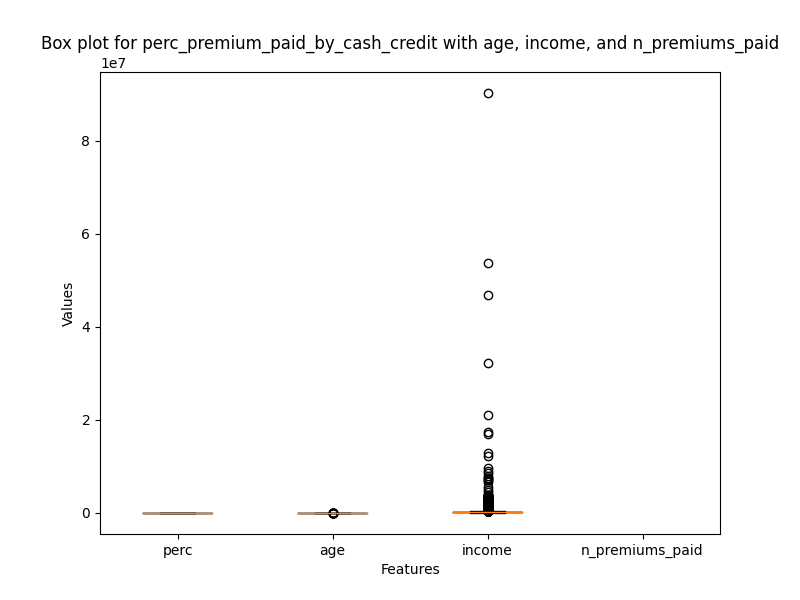

In [48]:
import matplotlib.pyplot as plt

# استخراج داده‌های مورد نیاز
perc = df['perc_premium_paid_by_cash_credit']
age = df['age_in_years']
income = df['Income']
n_premiums_paid = df['Count_3.6_months_late'] + df['Count_6.12_months_late'] + df['Count_more_than_12_months_late']

# رسم نمودار boxplot برای فیچر 'perc_premium_paid_by_cash_credit' با سن، درآمد و تعداد قسط‌های پرداخت
plt.figure(figsize=(8, 6))
plt.boxplot([perc, age, income, n_premiums_paid], labels=['perc', 'age', 'income', 'n_premiums_paid'])
plt.title('Box plot for perc_premium_paid_by_cash_credit with age, income, and n_premiums_paid')
plt.xlabel('Features')
plt.ylabel('Values')
plt.show()

## بررسي سن، درآمد ، درصد پرداختی از طریق نقدی و اعتباری و تعداد قسط های پرداخت شده در يك سال گذشته

<IPython.core.display.Javascript object>


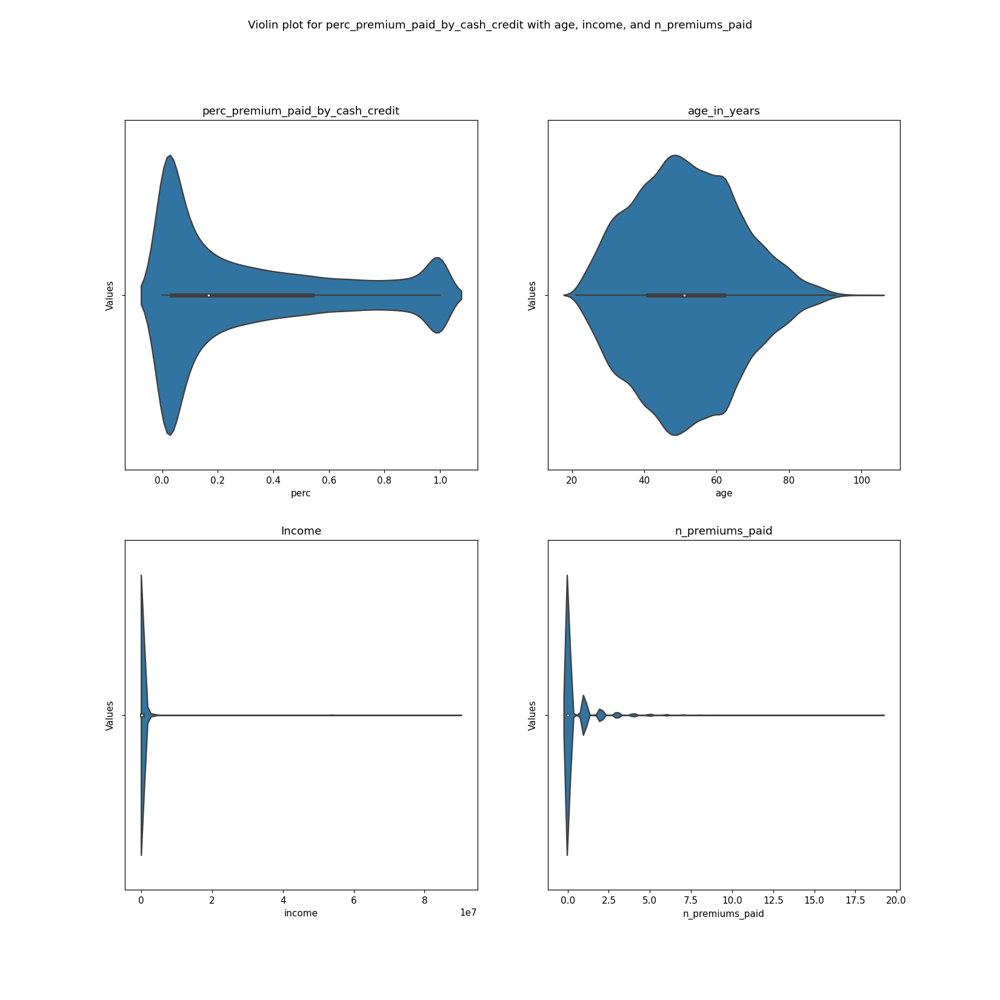

In [39]:
#رسم نمودار violinplot: با سن، درآمد ، درصد پرداختی از طریق نقدی و اعتباری و تعداد قسط های پرداخت شده در يك شال گذشته

import seaborn as sns

perc = df['perc_premium_paid_by_cash_credit'] #رنج این فیچر بین 0 تا 1 است و کوچکترین مقدار آن صفر و بزرگترین مقدار آن یک است.
age = df['age_in_years']
income = df['Income']
n_premiums_paid = df['Count_3.6_months_late'] + df['Count_6.12_months_late'] + df['Count_more_than_12_months_late']

plt.figure(figsize=(15, 15))
plt.subplot(2, 2, 1)
sns.violinplot(x=perc, data=df)
plt.title('perc_premium_paid_by_cash_credit')
plt.xlabel('perc') #درصد پرداختی از طریق نقدی و اعتباری
plt.ylabel('Values') #مقادیر فیچر 'perc_premium_paid_by_cash_credit'



plt.subplot(2, 2, 2)
sns.violinplot(x=age, data=df)
plt.title('age_in_years')
plt.xlabel('age')
plt.ylabel('Values')

plt.subplot(2, 2, 3)
sns.violinplot(x=income, data=df)
plt.title('Income')
plt.xlabel('income')
plt.ylabel('Values')

plt.subplot(2, 2, 4)
sns.violinplot(x=n_premiums_paid, data=df)
plt.title('n_premiums_paid')
plt.xlabel('n_premiums_paid')
plt.ylabel('Values')

plt.suptitle('Violin plot for perc_premium_paid_by_cash_credit with age, income, and n_premiums_paid')
plt.show()

<div dir = "rtl">
تحلیل دو نمودار بالا:
با توجه به این نمودار، می‌توانیم برای فیچر 'perc_premium_paid_by_cash_credit' متوسط مقدار پرداخت حق بیمه به صورت نقدی به اعتبار حدود 22 درصد است. همچنین، درصد بیشتری از پرداخت حق بیمه توسط مشتریان به صورت نقدی انجام شده است. همچنین، میزان پرداخت حق بیمه به صورت نقدی بین مشتریان با سن و درآمد متفاوتی توزیع شده است. به عبارت دیگر، می‌تواند برای افراد با سن و درآمد بالاتر، میزان پرداخت حق بیمه به صورت نقدی بیشتری وجود داشته باشد.
در این نمودار، نیز می‌توانیم توزیع سن، درآمد و تعداد قسط‌های پرداخت شده را برای داده‌های ما مشاهده کنیم. برای مثال، می‌توان دید که میانگین سن حدود 45 سال است و بیشترین تعداد مشتریان در گروه سنی 30 تا 60 سال دارند. همچنین، میانگین درآمد حدود 2.5 است و بیشترین تعداد مشتریان در گروه درآمدی 1 تا 3 هستند. در مورد تعداد قسط‌های پرداخت شده نیز می‌توان دید که بیشترین تعداد مشتریان تنها 1 قسط را به موقع پرداخت کرده اند. 

</div>

## بررسی رابطه‌ی بین سن و خطرات بیمه‌ای و ارائه‌ی تحلیل‌هایی برای بهبود پیش‌بینی خطر

<IPython.core.display.Javascript object>


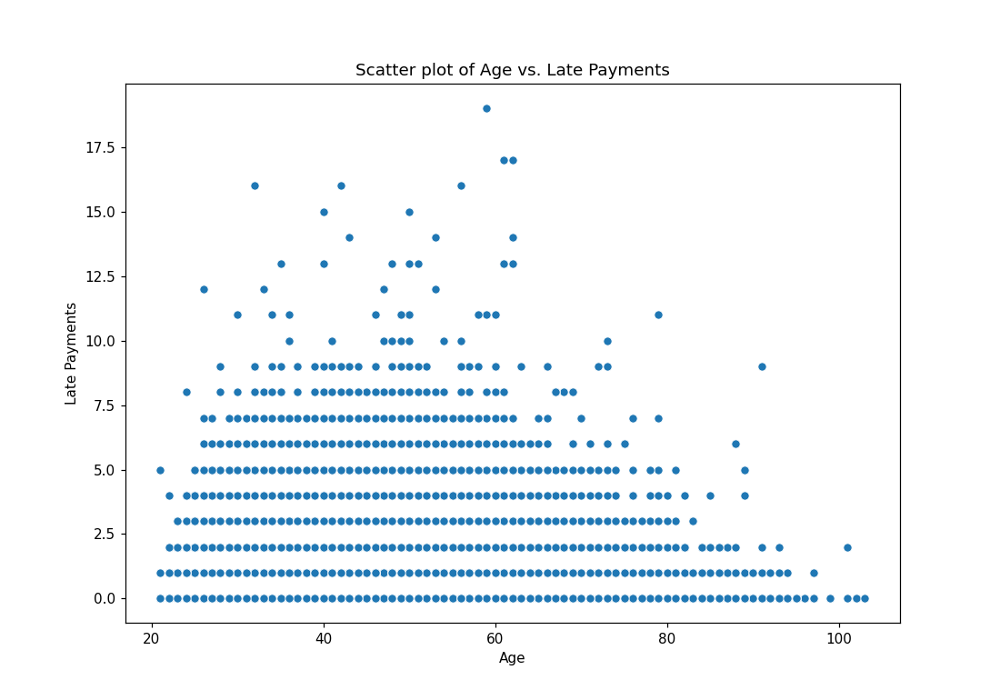

In [40]:
# نمودار scatter:  بررسی رابطه بین سن و تعداد پرداخت‌های تأخیری را رسم می‌کند
import seaborn as sns
import matplotlib.pyplot as plt

age = df['age_in_years']
late_payments = df[['Count_3.6_months_late', 'Count_6.12_months_late', 'Count_more_than_12_months_late']].sum(axis=1)

plt.figure(figsize=(10, 7))
sns.scatterplot(x=age, y=late_payments)
plt.title('Scatter plot of Age vs. Late Payments')
plt.xlabel('Age')
plt.ylabel('Late Payments')
plt.show()

<div dir = "rtl">
.نتيجه نمودار بالا: احتمالا با افزایش سن، تعداد پرداخت‌های تأخیری نیز افزایش می‌یابد. با رگرسيون بررسي مي نماييم
</div>

### رابطه سند و تعداد پرداختهاي تاخيري :

<div dir = "rtl">
 برای تحلیل پیش بینی خطر، ميتوان از روش رگرسیون استفاده کرد 
    به عنوان مثال، کد زیر برای رگرسیون خطی و غير خطي بین سن و تعداد پرداختهای تأخیری را نشان ميدهد:
</div>


<IPython.core.display.Javascript object>


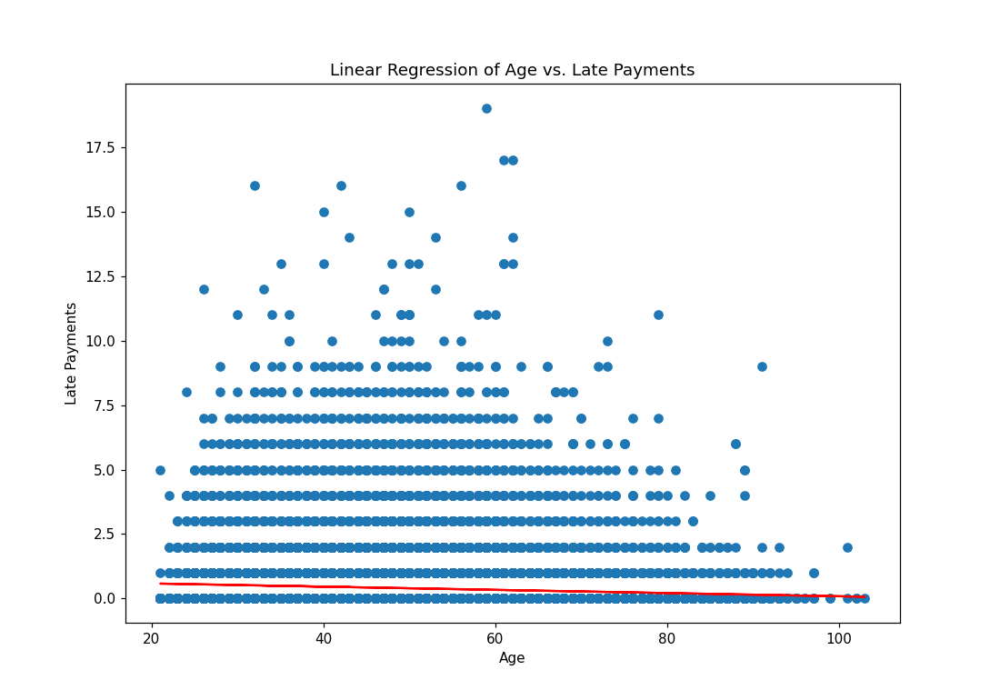

In [41]:
# کد زیر برای رگرسیون خطی بین سن و تعداد پرداخت‌های تأخیری:

from sklearn.linear_model import LinearRegression

X = df['age_in_years'].values.reshape(-1, 1)
y = df[['Count_3.6_months_late', 'Count_6.12_months_late', 'Count_more_than_12_months_late']].sum(axis=1)

regressor = LinearRegression()
regressor.fit(X, y)

plt.figure(figsize=(10, 7))
plt.scatter(X, y)
plt.plot(X, regressor.predict(X), color='red')
plt.title('Linear Regression of Age vs. Late Payments')
plt.xlabel('Age')
plt.ylabel('Late Payments')
plt.show()

با توجه به اين كه رگرسيون خطي جواب نداد از رگرسيون چند متغيره استفاده شد و نتايج در ذيل آن مورد بررسي قرار گرفت

In [42]:
# كدهاي ذيل در يك نوت بوك ديگر انجام شد و نتايج به اينجا منتقل شد:

# import numpy as np
# from sklearn.model_selection import train_test_split

# X = df['age_in_years'].values.reshape(-1, 1)
# y = df[['Count_3.6_months_late', 'Count_6.12_months_late', 'Count_more_than_12_months_late']].sum(axis=1)

# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [43]:
# from sklearn.preprocessing import PolynomialFeatures
# from sklearn.linear_model import LinearRegression

# poly = PolynomialFeatures(4)
# X_poly = poly.fit_transform(X_train)

# regressor = LinearRegression()
# regressor.fit(X_poly, y_train)

In [44]:
# X_test_poly = poly.transform(X_test)
# y_pred = regressor.predict(X_test_poly)

# from sklearn.metrics import r2_score

# r2_score = r2_score(y_test, y_pred)
# print('R-squared:', r2_score)

# # R-squared: 0.009862015117724665



<div dir='rtl'>
نتیجه رگرسیون بالا: این احتمال وجود دارد که با افزایش سن، تعداد پرداخت‌های تأخیری نیز افزایش یابد. در یک مدل رگرسیون بررسی شد و نتایج به صورت زیر شد:
با توجه به اینکه مقدار R-squared کمتر از 0.1 است، نتیجه می‌گیریم که رابطه بین سن و تعداد پرداخت‌های تأخیری به صورت خطی یا چندجمله‌ای به شدت ضعیف است و با استفاده از این متغیر مستقل نمی‌توان به خوبی پیش‌بینی تعداد پرداخت‌های تأخیری را انجام داد. به عبارت دیگر، این نتیجه نشان می‌دهد که عوامل دیگری مانند درآمد، تحصیلات، شغل و غیره می‌توانند رابطه قوی‌تری با تعداد پرداخت‌های تأخیری داشته باشند.
</div>


### بررسي رابطه  : 'Income', 'Count_3.6_months_late', 'Count_6.12_months_late', 'Count_more_than_12_months_late', 'application_underwriting_score', 'no_of_premiums_paid', 'age_in_years'

<div dir = "rtl">
برای فیچر 'Income' می توانیم به دنبال رابطه بین درآمد و خطرات بیمه ای بگرديم و تحلیل هایی برای بهبود پیش بینی خطر ارائه دهیم:در زمینه تحلیل رابطه بین درآمد و خطرات بیمه‌ای می‌توان تحقیقات و تحلیل‌های گوناگونی انجام داد. برای مثال، می‌توان با استفاده از تحلیل رگرسیون، چند متغيره بین درآمد و خطرات بیمه‌ای را بررسی کرد. همچنین، می‌توان با استفاده از تحلیل‌های مختلف مانند تحلیل عاملی و تحلیل خوشه‌ای، عوامل دیگری که می‌توانند رابطه با خطرات بیمه‌ای داشته باشند را شناسایی کرد.در صورتی که رابطه مستقیمی بین درآمد و خطرات بیمه‌ای وجود داشته باشد، می‌توان با افزایش درآمد، خطرات بیمه‌ای را کاهش داد. در این صورت، می‌توان با ارائه پیشنهاداتی برای افزایش درآمد، بهبود پیش‌بینی خطر و کاهش خطرات بیمه‌ای را ارائه داد.از طرفی، اگر رابطه معکوسی بین درآمد و خطرات بیمه‌ای وجود داشته باشد، می‌توان با کاهش درآمد، خطرات بیمه‌ای را کاهش داد. در این صورت نیز، می‌توان با ارائه پیشنهاداتی برای کاهش درآمد، بهبود پیش‌بینی خطر و کاهش خطرات بیمه‌ای را ارائه داد.بنابراین، بررسی رابطه بین درآمد و خطرات بیمه‌ای و ارائه پیشنهاداتی برای بهبود پیش‌بینی خطر، می‌تواند به کاهش خسارت‌های بیمه‌ای و بهبود بازدهی شرکت‌های بیمه کمک کند. 
در این کد، ابتدا داده‌های مورد نیاز (درآمد و سایر متغیرهای مستقل) در متغیرهای X و y قرار داده‌ایم. سپس با افزودن ترم مستقل به متغیرهای مستقل، مدل رگرسیون چند متغیره را با استفاده از کتابخانه Scikit-learn ایجاد کرده و با اجرای مدل، نتایج آن را چاپ می‌کنیم.
</div>

In [45]:
# كدهاي ذيل در يك نوت بوك ديگر انجام شد و نتايج به اينجا منتقل شد:

# import pandas as pd
# from sklearn.impute import SimpleImputer
# from sklearn.linear_model import LinearRegression

# # جدا کردن متغیرهای وابسته (خطر بیمه ای) و مستقل
# y = df['renewal']
# X = df[['Income', 'Count_3.6_months_late', 'Count_6.12_months_late', 'Count_more_than_12_months_late', 'application_underwriting_score', 'no_of_premiums_paid', 'age_in_years']]

# # جایگزینی مقادیر مفقود با میانگین
# imputer = SimpleImputer()
# X = imputer.fit_transform(X)

# # ایجاد مدل رگرسیون چند متغیره
# model = LinearRegression()

# # اجرای مدل رگرسیون
# model.fit(X, y)

# # چاپ خروجی مدل
# print('Intercept:', model.intercept_)
# print('Coefficients:', model.coef_)

<div dir = "rtl" >
با توجه به خروجی ارائه شده، می‌توان تحلیل‌هایی درباره رابطه بین متغیرهای مستقل و وابسته ارائه داد:
1. Income: ضریب رگرسیون برای این متغیر بسیار کوچک است و نزدیک به صفر است، بنابراین نمی‌توان گفت که رابطه مستقیمی بین درآمد و خطرات بیمه‌ای وجود دارد.
2. Count_3.6_months_late: ضریب رگرسیون منفی است، بنابراین افزایش تعداد پرداخت‌های تأخیری در 3-6 ماه گذشته باعث کاهش خطرات بیمه‌ای می‌شود.
3. Count_6.12_months_late: ضریب رگرسیون منفی است، بنابراین افزایش تعداد پرداخت‌های تأخیری در 6-12 ماه گذشته باعث کاهش خطرات بیمه‌ای می‌شود.
4. Count_more_than_12_months_late: ضریب رگرسیون منفی است، بنابراین افزایش تعداد پرداخت‌های تأخیری بیشتر از 12 ماه گذشته باعث کاهش خطرات بیمه‌ای می‌شود.
5. application_underwriting_score: ضریب رگرسیون مثبت است، بنابراین افزایش امتیاز ارزیابی درخواست بیمه باعث افزایش خطرات بیمه‌ای می‌شود.
6. no_of_premiums_paid: ضریب رگرسیون بسیار کوچک است و نزدیک به صفر است، بنابراین نمی‌توان گفت که رابطه مستقیمی بین تعداد پرداخت‌های بیمه‌ای و خطرات بیمه‌ای وجود دارد.
7. age_in_years: ضریب رگرسیون بسیار کوچک است و نزدیک به صفر است، بنابراین نمی‌توان گفت که رابطه مستقیمی بین سن و خطرات بیمه‌ای وجود دارد.
با توجه به تحلیل بالا، می‌توان نتیجه گرفت که تنها متغیر application_underwriting_score با خطرات بیمه‌ای مستقیما مرتبط است و افزایش این متغیر باعث افزایش خطرات بیمه‌ای می‌شود. 
در مقابل، تعداد پرداخت‌های تأخیری در 3-6، 6-12 و بیشتر از 12 ماه گذشته باعث کاهش خطرات بیمه‌ای می‌شود. برای متغیرهای دیگر، رابطه مستقیم یا مستقیم معکوسی با خطرات بیمه‌ای وجود ندارد.
 با این حال، باید توجه داشت که این تحلیل با توجه به داده‌های موجود و روش استفاده شده برای مدل‌سازی انجام شده است و بهتر است با توجه به شرایط و محدودیت‌های مربوطه، تحلیل‌های دقیق‌تری انجام شود.
</div>

In [46]:
# ضرایب رگرسیون برای هر یک از متغیرهای مستقل
coefficients = [1.75534314e-09, -5.39105354e-02, -1.17506703e-01, -1.04052012e-01, 1.73586822e-02, 6.08570598e-04, 9.65862840e-04]

print(len(coefficients))
print(range(len(coefficients)))
# پیدا کردن شاخص عنصر با بیشترین مقدار
index_of_max_coefficient = max(range(len(coefficients)), key=lambda i: abs(coefficients[i]))
index_of_max_coefficient

7
range(0, 7)


2

<div dir = "rtl"
کدام یک از متغیرهای مستقل بیشترین تأثیر را بر روی متغیر وابسته دارد
</dir>

In [47]:
# کدام یک از متغیرهای مستقل بیشترین تأثیر را بر روی متغیر وابسته دارد

# ضرایب رگرسیون برای هر یک از متغیرهای مستقل
coefficients = [1.75534314e-09, -0.0539105354, -0.117506703, -0.104052012, 0.0173586822, 0.000608570598, 0.00096586284]

# پیدا کردن شاخص عنصر با بیشترین مقدار
index_of_max_coefficient = max(range(len(coefficients)), key=lambda i: abs(coefficients[i]))

# متغیر مستقل با بیشترین تأثیر را چاپ کنید
if index_of_max_coefficient == 0:
    print("Income has the greatest impact.")
elif index_of_max_coefficient == 1:
    print("Count_3.6_months_late has the greatest impact.")
elif index_of_max_coefficient == 2:
    print("Count_6.12_months_late has the greatest impact.")
elif index_of_max_coefficient == 3:
    print("Count_more_than_12_months_late has the greatest impact.")
elif index_of_max_coefficient == 4:
    print("application_underwriting_score has the greatest impact.")
elif index_of_max_coefficient == 5:
    print("no_of_premiums_paid has the greatest impact.")
elif index_of_max_coefficient == 6:
    print("age_in_years has the greatest impact.")

Count_6.12_months_late has the greatest impact.


<div dir = "rtl">
در پیش‌بینی تأثیر هریک از متغیرهای مستقل بر متغیر وابسته، با استفاده از مدل رگرسیون، ضرایبی برای هریک از متغیرهای مستقل به دست می‌آید. این ضرایب، نشان دهنده‌ی میزان تأثیری است که هر متغیر مستقل بر متغیر وابسته دارد. برای پیدا کردن متغیر مستقلی که بیشترین تأثیر را بر متغیر وابسته دارد، می‌توانیم از ضرایب رگرسیون استفاده کنیم. 
با توجه به این ضرایب، می‌توانیم بر اساس شاخص عنصری که بیشترین مقدار را دارد، متغیر مستقلی که بیشترین تأثیر را دارد را پیدا کنیم. بر اساس کدی که ارائه داده شد، شاخص عنصری که بیشترین مقدار مطلق را دارد، متغیر مستقلی است که بیشترین تأثیر را دارد. 
در این حالت، شاخص عنصری که بیشترین مقدار مطلق را دارد، 2 است که متناظر با متغیر مستقل `Count_6.12_months_late` است. بنابراین، نتیجه این است که `Count_6.12_months_late` بیشترین تأثیر را بر متغیر وابسته دارد.
</dir>

## شناسايي فيچرهاي مهم

<div dir = "rtl">
    یکی از روش‌های شناسايي فيچرهاي مهم ، روش شناوری درخت تصمیم  است. در این روش، یک مدل شامل چندین درخت تصمیم ساخته می‌شود و اهميت هر ویژگی در پیش‌بینی خروجی، با توجه به میزان کاهش داده شدن خطا با استفاده از آن ویژگی، اندازه‌گیری می‌شود:. 
    </div>

In [48]:
# اين كد بعد از مديريت داده هاي كتگوريكال قابل اجراست


# from sklearn.ensemble import RandomForestClassifier
# import pandas as pd

# # جدا کردن ویژگی‌ها و برچسب‌ها
# X = df.drop('renewal', axis=1)
# y = df[['perc_premium_paid_by_cash_credit', 'age_in_years', 'Income',
#         'Count_3.6_months_late', 'Count_6.12_months_late',
#         'Count_more_than_12_months_late', 'application_underwriting_score',
#         'no_of_premiums_paid', 'sourcing_channel', 'residence_area_type',
#         'premium']]

# # ساخت یک مدل شناوری درخت تصمیم با 100 درخت
# rf = RandomForestClassifier(n_estimators=100, random_state=0)

# # آموزش مدل
# rf.fit(X, y)

# # محاسبه‌ی مهمیت هر ویژگی
# importances = rf.feature_importances_

# # چاپ مهمیت هر ویژگی
# for i, importance in enumerate(importances):
#     print(f"Feature {i}: {importance}")

<div dir = "rtl">
نتايج بررسي - Loyal Insurer_Step 1_ Pre-Processing:
</div>

1- n_premiums_paid = df['Count_3.6_months_late'] + df['Count_6.12_months_late'] + df['Count_more_than_12_months_late']

<div dir = "rtl">
توجه داشته باشید که این مقدار می تواند به عنوان یکی از ویژگی های ورودی (مستقل) در مدل های پیش بینی استفاده شود، به عنوان مثال در تعیین احتمال پرداخت بیمه گذار برای دوره بعدی.
</div>
2-late_payments = df[['Count_3.6_months_late', 'Count_6.12_months_late', 'Count_more_than_12_months_late']].sum(axis=1)

<div dir = "rtl">
نتيجه: با افزایش سن، تعداد پرداخت‌های تأخیری نیز افزایش می‌یابد.
</div>

<div dir='rtl'>
3- این احتمال وجود دارد که با افزایش سن، تعداد پرداخت‌های تأخیری نیز افزایش یابد. در یک مدل رگرسیون بررسی شد و نتایج به صورت زیر شد:
با توجه به اینکه مقدار R-squared کمتر از 0.1 است، نتیجه می‌گیریم که رابطه بین سن و تعداد پرداخت‌های تأخیری به صورت خطی یا چندجمله‌ای به شدت ضعیف است و با استفاده از این متغیر مستقل نمی‌توان به خوبی پیش‌بینی تعداد پرداخت‌های تأخیری را انجام داد. به عبارت دیگر، این نتیجه نشان می‌دهد که عوامل دیگری مانند درآمد، تحصیلات، شغل و غیره می‌توانند رابطه قوی‌تری با تعداد پرداخت‌های تأخیری داشته باشند.
</div>

ادامه دارد ....



### Log Transform+2---- Income   =>   LogIncome

<div dir = "rtl">
ستون Income را تصمیم گرفتیم لگاریتم بگیریم و با اینکه میدانیم که پیش پردازش بایستی بعد از تقسیم داده ها به آموزش و تست انجام شود ولی چون بایستی داده اصلی این تغییر رویش انجام می شد قبل از تقسیم دادگان این عملیات را انجام دادیم.
    در ضمن می دانیم که باید بعد از اجرای الگوریتم باید np.exp(Income) جهت Inverse Transforms انجام دهیم.
</div>

In [53]:
L = df['Income'].median() - 3.5*df['Income'].std()
U = df['Income'].median() + 3.5*df['Income'].std()
df_o = df[ (df['Income']>U) | (df['Income']<L) ]           # outliers
# df_i = df[ (df['income']<=U) & (df['income']>=L) ]       inliers
df_o


,perc_premium_paid_by_cash_credit,age_in_years,Income,Count_3.6_months_late,Count_6.12_months_late,Count_more_than_12_months_late,application_underwriting_score,no_of_premiums_paid,sourcing_channel,residence_area_type,premium,renewal
250,0.029,87,2910090,0.0,0.0,0.0,99.86,7,A,Rural,60000,1
1067,0.012,67,2550090,0.0,0.0,0.0,99.86,15,A,Rural,60000,1
1723,0.196,72,5547190,0.0,0.0,0.0,NaN,5,A,Urban,60000,1
1766,0.020,61,5001070,0.0,0.0,0.0,NaN,8,B,Urban,60000,1
2957,0.281,51,9720110,0.0,0.0,0.0,99.49,29,A,Urban,60000,1
...,...,...,...,...,...,...,...,...,...,...,...,...
46289,0.014,66,3045050,1.0,0.0,0.0,99.62,19,D,Urban,60000,1
46912,0.763,44,2250070,0.0,0.0,0.0,99.89,3,D,Urban,60000,1
49224,0.405,56,3323310,0.0,0.0,0.0,99.81,14,A,Rural,11700,1
49575,1.000,43,2190130,0.0,0.0,0.0,99.75,8,C,Urban,60000,1


فیچر درآمد به تعداد 73 ردیف داده پرت دارد

In [54]:
import matplotlib.pyplot as plt
import seaborn as sns

def show_distribution(data):
    # ایجاد شکل با ۲ ستون و ۱ ردیف به اندازه ۱۵ در ۱۰ اینچ
    # figsize را می توانستیم جداگانه تنظیم کنیم
    fig, ax = plt.subplots(2, 1, figsize=(15, 10))
    
    # تعیین عنوان برای شکل
    ax[0].set_title("Data Distribution")
    
    # رسم یک کرنل دنسی پلات با استفاده از کتابخانه Seaborn
    # با استفاده از رنگ آبی و پر شدن ناحیه زیر نمودار
    sns.kdeplot(data, color ="blue", fill=True, ax = ax[0])
    
    # رسم یک باکس پلات با استفاده از کتابخانه Seaborn
    # با استفاده از رنگ آبی
    sns.boxplot(x=data, color ="blue", ax = ax[1])
    
    # تنظیم محدوده محور x در هر ستون شکل بر اساس اندازه داده‌ها
    ax[0].set_xlim(min(data)-200, max(data)+200)
    ax[1].set_xlim(min(data)-200, max(data)+200)

    # نمایش شکل
    plt.show()

<IPython.core.display.Javascript object>


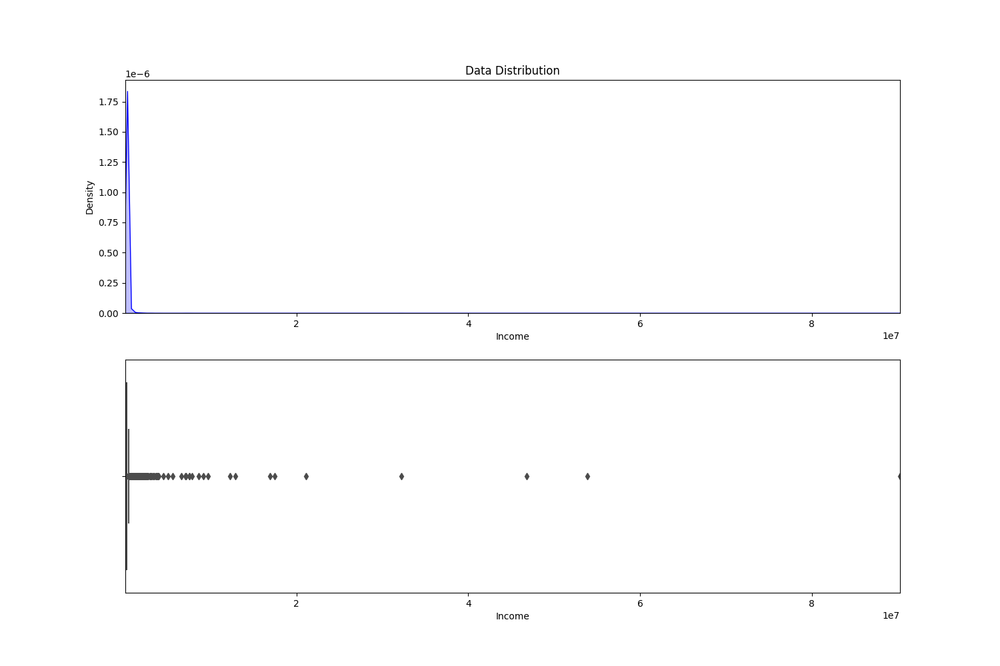

In [57]:
show_distribution(df['Income'])

In [58]:
# %matplotlib notebook
# رسم نمودار هیستوگرام LogIncome با استفاده از تابع hist() در Pandas
df['Income'].hist(bins=20)

# نامگذاری محور x و y
plt.xlabel('Income')
plt.ylabel('Frequency')

# نمایش نمودار
plt.show()

In [59]:
# Income to LogIncome Transform:

import numpy as np
import pandas as pd

# تبدیل فیچر "Income" به لگاریتم با اضافه کردن دو و اضافه کردن به عنوان ستون سوم
df.insert(2, 'LogIncome', np.log(df['Income'] + 2))

# حذف ستون Income
df.drop('Income', axis=1, inplace=True)

In [60]:
df.head(5)

,perc_premium_paid_by_cash_credit,age_in_years,LogIncome,Count_3.6_months_late,Count_6.12_months_late,Count_more_than_12_months_late,application_underwriting_score,no_of_premiums_paid,sourcing_channel,residence_area_type,premium,renewal
0,0.429,33,12.780048,0.0,0.0,0.0,99.02,13,C,Urban,3300,1
1,0.917,48,11.340261,2.0,3.0,1.0,98.69,7,C,Rural,3300,0
2,0.049,42,12.431262,0.0,0.0,0.0,99.57,9,A,Urban,9600,1
3,0.052,86,12.199461,0.0,0.0,0.0,99.87,12,B,Urban,9600,1
4,1.000,68,11.681841,0.0,0.0,0.0,99.05,11,B,Urban,7500,1


<IPython.core.display.Javascript object>


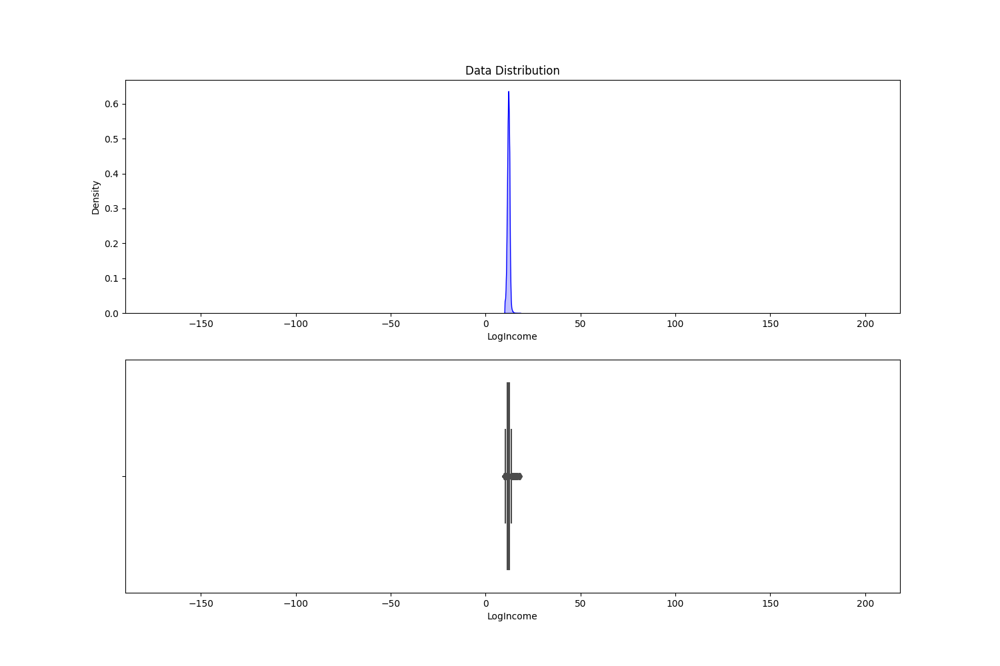

In [61]:
show_distribution(df['LogIncome'])

<IPython.core.display.Javascript object>


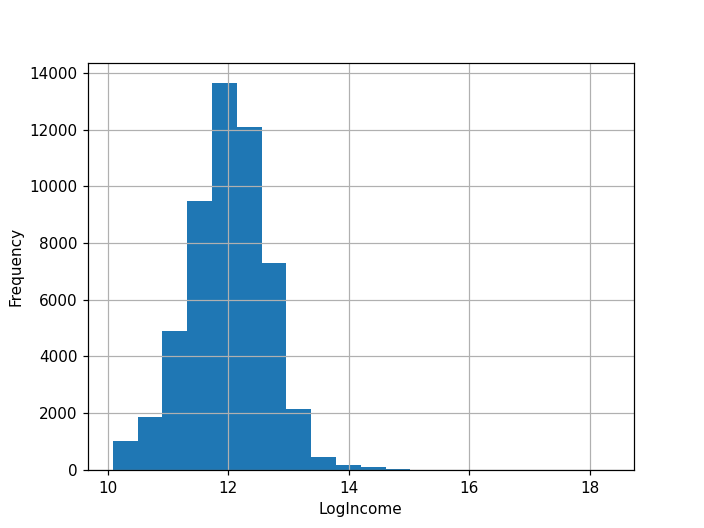

In [56]:
# %matplotlib notebook

# رسم نمودار هیستوگرام LogIncome با استفاده از تابع hist() در Pandas
df['LogIncome'].hist(bins=20)

# نامگذاری محور x و y
plt.xlabel('LogIncome')
plt.ylabel('Frequency')

# نمایش نمودار
plt.show()

In [57]:
import pandas as pd

# محاسبه شاخهای آماری ستون LogIncome
mean_logincome = df['LogIncome'].mean()
median_logincome = df['LogIncome'].median()
std_logincome = df['LogIncome'].std()
min_logincome = df['LogIncome'].min()
max_logincome = df['LogIncome'].max()

# چاپ شاخهای آماری ستون LogIncome
print('Mean LogIncome: ', mean_logincome)
print('Median LogIncome: ', median_logincome)
print('Standard Deviation of LogIncome: ', std_logincome)
print('Minimum LogIncome: ', min_logincome)
print('Maximum LogIncome: ', max_logincome)

Mean LogIncome:  12.001370783234185
Median LogIncome:  12.019514118209567
Standard Deviation of LogIncome:  0.6605671412292304
Minimum LogIncome:  10.08714155456386
Maximum LogIncome:  18.31823377977833


### Log Transform+2--- Premium   =>   LogPremium

In [62]:
# Premium => LogPremium

# تبدیل فیچر "Income" به لگاریتم با اضافه کردن دو و اضافه کردن به عنوان ستون سوم
df.insert(11, 'LogPremium', np.log(df['premium'] + 2))

# حذف ستون Income
df.drop('premium', axis=1, inplace=True)

In [65]:
# %matplotlib notebook

# رسم نمودار هیستوگرام LogIncome با استفاده از تابع hist() در Pandas
df['LogPremium'].hist(bins=20)

# نامگذاری محور x و y
plt.xlabel('LogPremium')
plt.ylabel('Frequency')

# نمایش نمودار
plt.show()

In [64]:
# محاسبه شاخص‌های آماری ستون LogPremium
mean_LogPremium = df['LogPremium'].mean()
median_LogPremiume = df['LogPremium'].median()
std_LogPremium = df['LogPremium'].std()
min_LogPremium = df['LogPremium'].min()
max_LogPremium = df['LogPremium'].max()

# چاپ شاخص‌های آماری ستون LogIncome
print('Mean LogPremium: ', mean_LogPremium)
print('Median LogPremium: ', median_LogPremiume)
print('Standard Deviation of LogPremium: ', std_LogPremium)
print('Minimum LogPremium: ', min_LogPremium)
print('Maximum LogPremium: ', max_LogPremium)

Mean LogPremium:  8.963752019328513
Median LogPremium:  8.922924930641832
Standard Deviation of LogPremium:  0.8596367833364824
Minimum LogPremium:  7.091742115095153
Maximum LogPremium:  11.002133173982028


# Dealing With Duplicate Values

In [66]:
df[df.duplicated()]

,perc_premium_paid_by_cash_credit,age_in_years,LogIncome,Count_3.6_months_late,Count_6.12_months_late,Count_more_than_12_months_late,application_underwriting_score,no_of_premiums_paid,sourcing_channel,residence_area_type,LogPremium,renewal
33849,0.0,22,10.116662,0.0,0.0,0.0,NaN,4,A,Urban,7.091742,1


In [67]:
df = df.drop_duplicates(subset=None, keep='last')


In [68]:
df[df.duplicated()]

,perc_premium_paid_by_cash_credit,age_in_years,LogIncome,Count_3.6_months_late,Count_6.12_months_late,Count_more_than_12_months_late,application_underwriting_score,no_of_premiums_paid,sourcing_channel,residence_area_type,LogPremium,renewal


### Defining Categorical Features 

In [69]:
# دریافت نام ستو نهای کتگوریکال
cat_columns = df.select_dtypes(['object']).columns
print(cat_columns)

Index([], dtype='object')


## Summary Information About Categorical Features 

In [70]:
# براي اينكه بتوانيم نمودارهاي مخصوص داده هاي كتگوري را نصب كنيم ستون هاي كتگوري را به كتگوري تبديل كرديم
categorical_columns = ['sourcing_channel', 'residence_area_type']
df.loc[:, categorical_columns] = df.loc[:, categorical_columns].astype('category')

df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 53235 entries, 0 to 53235
Data columns (total 12 columns):
 #   Column                            Non-Null Count  Dtype   
---  ------                            --------------  -----   
 0   perc_premium_paid_by_cash_credit  53235 non-null  float64 
 1   age_in_years                      53235 non-null  int64   
 2   LogIncome                         53235 non-null  float64 
 3   Count_3.6_months_late             53171 non-null  float64 
 4   Count_6.12_months_late            53171 non-null  float64 
 5   Count_more_than_12_months_late    53171 non-null  float64 
 6   application_underwriting_score    51260 non-null  float64 
 7   no_of_premiums_paid               53235 non-null  int64   
 8   sourcing_channel                  53235 non-null  category
 9   residence_area_type               53235 non-null  category
 10  LogPremium                        53235 non-null  float64 
 11  renewal                           53235 non-null  int6

C:\Users\Administrator\AppData\Local\Temp\ipykernel_11724\2402486482.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, categorical_columns] = df.loc[:, categorical_columns].astype('category')
C:\Users\Administrator\AppData\Local\Temp\ipykernel_11724\2402486482.py:3: DeprecationWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  df.loc[:, categorical_columns] = df.loc[:, categorical_columns].astype('category')


In [71]:
df["sourcing_channel"].dtype

CategoricalDtype(categories=['A', 'B', 'C', 'D', 'E'], ordered=False)

In [72]:
df["residence_area_type"].dtype

CategoricalDtype(categories=['Rural', 'Urban'], ordered=False)

### Dependence Graphs of Continuous Features on Categorical Features

In [73]:
def show_cont_on_cat(data, continues, categorical):
    f, ax = plt.subplots(1, 2, figsize = (15,5))
    sns.boxplot(x = categorical, y = continues, palette = "Blues", data = data, ax = ax[0])
    sns.histplot(data, x = continues, hue = categorical, multiple = "stack", palette = "Blues",
                 edgecolor = ".3", linewidth = .5, ax = ax[1])
    plt.show()

<IPython.core.display.Javascript object>


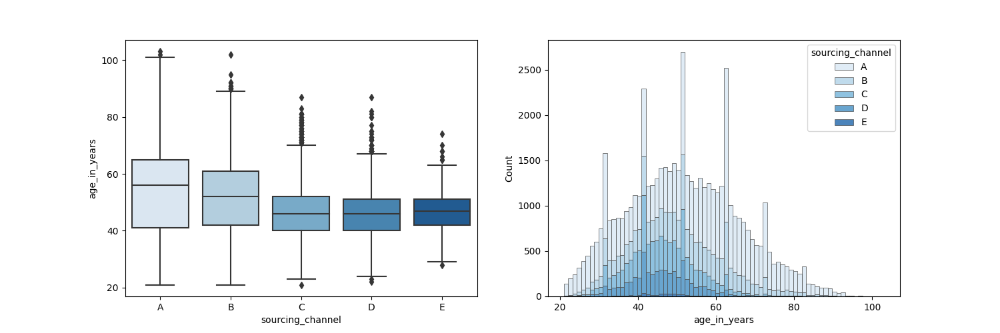

In [74]:
show_cont_on_cat(df, "age_in_years", "sourcing_channel")

<IPython.core.display.Javascript object>


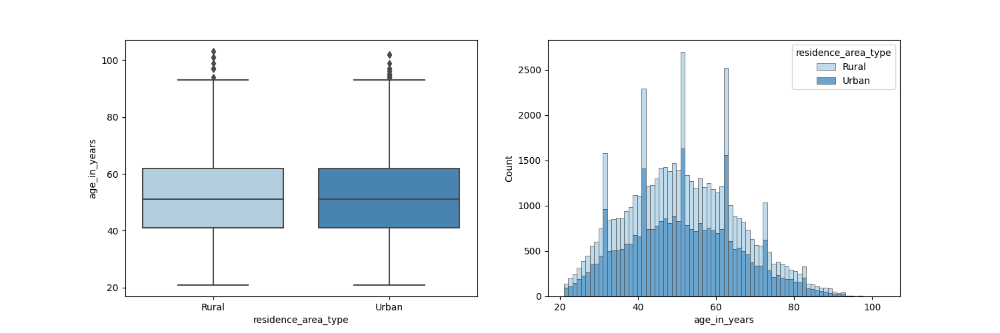

In [75]:
show_cont_on_cat(df, "age_in_years", "residence_area_type")

<IPython.core.display.Javascript object>


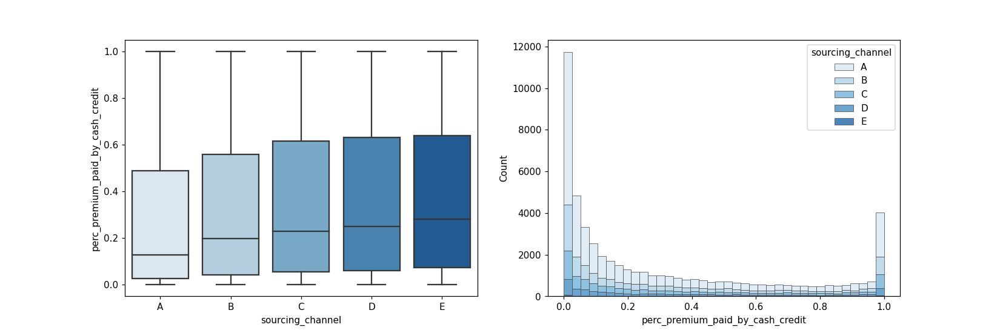

In [72]:
show_cont_on_cat(df, "perc_premium_paid_by_cash_credit", "sourcing_channel")

E بر اساس چند نمودار بالا سنهاي 40 تا 50 پرداخت نقدي بيشتري داشته اند و براساس كانال

<IPython.core.display.Javascript object>


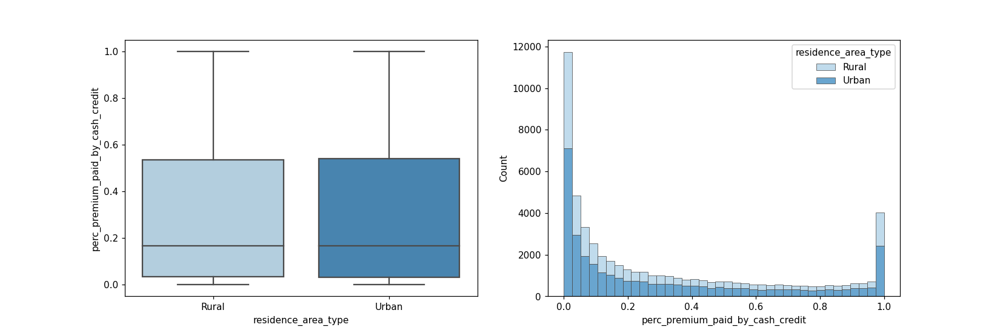

In [73]:
show_cont_on_cat(df, "perc_premium_paid_by_cash_credit", "residence_area_type")

### Dependence Graphs of Categorical Features on Categorical Features 

In [74]:
def show_cat_on_cat(data, categorical1, categorical2):
    sns.countplot(x = categorical1, hue = categorical2, palette = "Blues", data = data)
    plt.show()

<IPython.core.display.Javascript object>


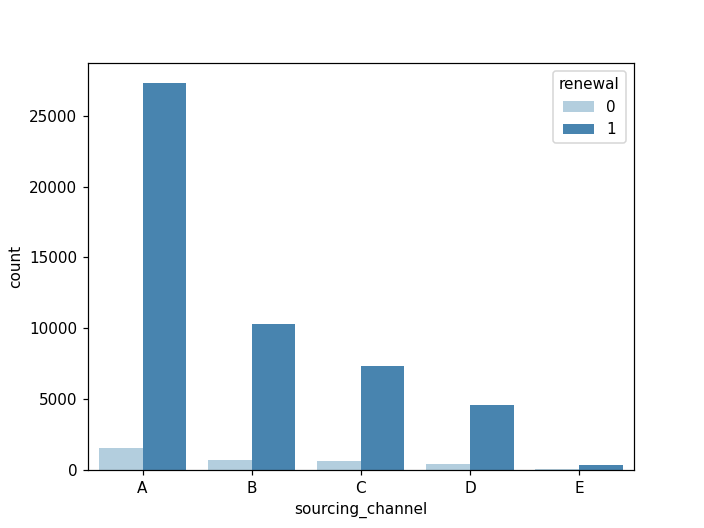

In [75]:
# %matplotlib notebook
show_cat_on_cat(df, "sourcing_channel", "renewal")

<IPython.core.display.Javascript object>


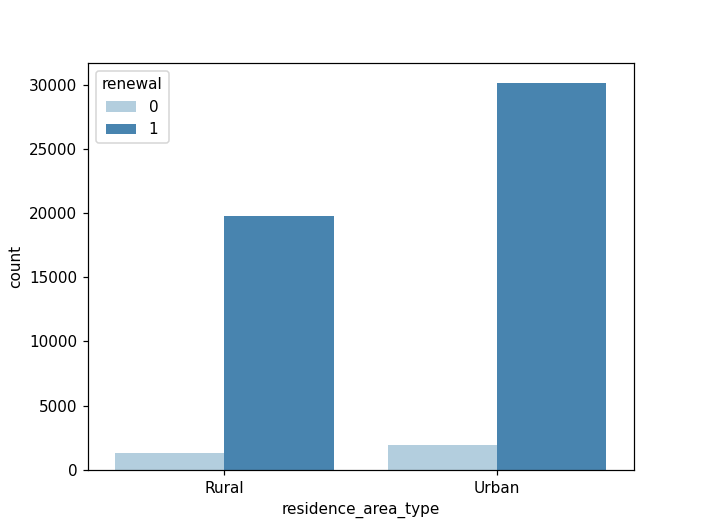

In [76]:
show_cat_on_cat(df, "residence_area_type", "renewal")

## Manage Categorical Date:

### Notice for Null Data in Encoding:
<div dir = "rtl">
     یادتان باشداگر ستونهای کتگوریکال دارای داده نول بودند می توانستیم در انکودینگ بیاییم داده های نول را یک کاراکتر جدیدی شبیه کارکترهای قبلی بدهیم و در یک ستون جدید آن را قرار دهیم. 

example:     
Columns before encoding : a,b,c, null  => Columns after encoding : a,b,c, d (d as a null)

result: we have 4 column after encoding instead of 3 columns
    <div/>

### 1- residence_area_type Lable Encoding:

In [77]:
from sklearn.preprocessing import LabelEncoder

def label_encode_data(df , df_test, category_columns):
    """
    تبدیل داده های دسته ای به متغیرهای شناور با استفاده از Label Encoder
    param train_data: داده های آموزشی
    param test_data: داده های تست
    param category_columns: نام فیچرهای دسته ای
    return: داده های آموزشی و تست تبدیل شده
    """
    for col in category_columns:
        # ایجاد یک نمونه از کلاس LabelEncoder
        le = LabelEncoder()
        
        # تبدیل داده های آموزشی
        df[col] = le.fit_transform(df[col])
        
        # تبدیل داده های تست
        df_test[col] = le.transform(df_test[col])
    
    return df, df_test

In [78]:
# نام فیچرهای دسته ای
category_columns = ['residence_area_type']

# تبدیل داده های دسته ای به متغیرهای شناور با استفاده از Label Encoder
df, df_test = label_encode_data(df, df_test, category_columns)

C:\Users\Administrator\AppData\Local\Temp\ipykernel_11724\2465616421.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[col] = le.fit_transform(df[col])


In [79]:
df.dtypes

perc_premium_paid_by_cash_credit     float64
age_in_years                           int64
LogIncome                            float64
Count_3.6_months_late                float64
Count_6.12_months_late               float64
Count_more_than_12_months_late       float64
application_underwriting_score       float64
no_of_premiums_paid                    int64
sourcing_channel                    category
residence_area_type                    int32
LogPremium                           float64
renewal                                int64
dtype: object

### 2- sourcing_channel Dummies Encoding:

In [82]:
# # کد صحیح است ولی برای هر بار استفاده از حالت مارک خارج شود:

# # تبدیل فیچر "sourcing_channel" به فیچرهای جدید با Dummies Encoding
# df = pd.get_dummies(df, columns=['sourcing_channel'], prefix='sourcing_channel')
# df_test = pd.get_dummies(df_test, columns=['sourcing_channel'], prefix='sourcing_channel')

# #حذف فیچر اصلی "sourcing_channel"
# df.drop('sourcing_channel', axis=1, inplace=True)
# df_test.drop('sourcing_channel', axis=1, inplace=True)

# # جابجایی فیچرهای جدید به جای فیچر اصلی
# for i in range(1, 7):
#     df.insert(8+i, f'sourcing_channel_{i}', df.pop(f'sourcing_channel_{i}'))
#     df_test.insert(8+i, f'sourcing_channel_{i}', df_test.pop(f'sourcing_channel_{i}'))

In [81]:
df.columns

Index(['perc_premium_paid_by_cash_credit', 'age_in_years', 'LogIncome',
       'Count_3.6_months_late', 'Count_6.12_months_late',
       'Count_more_than_12_months_late', 'application_underwriting_score',
       'no_of_premiums_paid', 'residence_area_type', 'LogPremium', 'renewal',
       'sourcing_channel_A', 'sourcing_channel_B', 'sourcing_channel_C',
       'sourcing_channel_D', 'sourcing_channel_E'],
      dtype='object')

In [83]:
len(df.columns)

16

In [84]:
df.dtypes

perc_premium_paid_by_cash_credit    float64
age_in_years                          int64
LogIncome                           float64
Count_3.6_months_late               float64
Count_6.12_months_late              float64
Count_more_than_12_months_late      float64
application_underwriting_score      float64
no_of_premiums_paid                   int64
residence_area_type                   int32
LogPremium                          float64
renewal                               int64
sourcing_channel_A                    uint8
sourcing_channel_B                    uint8
sourcing_channel_C                    uint8
sourcing_channel_D                    uint8
sourcing_channel_E                    uint8
dtype: object

##### انتقال ستون هدف به ستون آخر:

In [85]:
# انتقال ستون target به انتهای دیتافریم
renewal_col = df.pop('renewal')
df['renewal'] = renewal_col

In [86]:
df.head()

,perc_premium_paid_by_cash_credit,age_in_years,LogIncome,Count_3.6_months_late,Count_6.12_months_late,Count_more_than_12_months_late,application_underwriting_score,no_of_premiums_paid,residence_area_type,LogPremium,sourcing_channel_A,sourcing_channel_B,sourcing_channel_C,sourcing_channel_D,sourcing_channel_E,renewal
0,0.429,33,12.780048,0.0,0.0,0.0,99.02,13,1,8.102284,0,0,1,0,0,1
1,0.917,48,11.340261,2.0,3.0,1.0,98.69,7,0,8.102284,0,0,1,0,0,0
2,0.049,42,12.431262,0.0,0.0,0.0,99.57,9,1,9.169727,1,0,0,0,0,1
3,0.052,86,12.199461,0.0,0.0,0.0,99.87,12,1,9.169727,0,1,0,0,0,1
4,1.000,68,11.681841,0.0,0.0,0.0,99.05,11,1,8.922925,0,1,0,0,0,1


In [87]:
len(df.columns)

16

In [88]:
df.shape

(53235, 16)

In [89]:
df_test.shape

(26617, 15)

## انتقال ديتا به نوت بوك: Loyal Insurer_Step 2_ Pre-Processing_Cleaning_Feature Engineering

In [90]:

# ذخیره داده های train به فرمت CSV
df.to_csv('df.csv', index=False)

# ذخیره داده های test به فرمت CSV
df_test.to_csv('df_test.csv', index=False)


# End of Step 1 Pre-processing_Visualization_EDA

- Continue working on the file (Loyal Insurer_Post Processing)